<a href="https://colab.research.google.com/github/meetptl04/ImageStyleTranfer/blob/main/ImageStyleTransfer_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

## Image Processing Class
* The `ImageProcessing` class provides static methods for loading and processing images for neural network input, and for converting processed images back to a viewable format. Specifically, it resizes and normalizes images for VGG19 and performs de-normalization for display.

In [15]:
class ImageProcessing:
    @staticmethod
    def load_and_process_tensor(image_tensor):
        """Process image tensor with correct normalization"""
        # Convert to float32 if not already
        image_tensor = tf.cast(image_tensor, tf.float32)

        # Ensure pixel values are between 0 and 255
        if tf.reduce_max(image_tensor) <= 1.0:
            image_tensor = image_tensor * 255.0

        # Resize maintaining aspect ratio
        max_dim = 512
        shape = tf.cast(tf.shape(image_tensor)[:-1], tf.float32)
        long_dim = tf.reduce_max(shape)
        scale = max_dim / long_dim
        new_shape = tf.cast(shape * scale, tf.int32)
        image_tensor = tf.image.resize(image_tensor, new_shape)

        # Preprocess for VGG19
        image_tensor = tf.keras.applications.vgg19.preprocess_input(image_tensor)
        return tf.expand_dims(image_tensor, 0)

    @staticmethod
    def deprocess_img(processed_img):
        """Correctly deprocess the image for visualization"""
        x = processed_img.copy()
        if len(x.shape) == 4:
            x = np.squeeze(x, 0)

        # Reverse VGG preprocessing
        x[:, :, :] += [103.939, 116.779, 123.68]
        x = x[..., ::-1]  # BGR to RGB

        # Clip to valid range
        x = np.clip(x, 0, 255).astype('uint8')
        return x

## Loss Function Class
* This class defines a model that calculates the style and content loss for image style transfer.

In [16]:
class LossFunctions:
    @staticmethod
    def gram_matrix(input_tensor):
        """Calculate Gram matrix with correct scaling"""
        result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
        input_shape = tf.shape(input_tensor)
        num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
        return result / num_locations

    @staticmethod
    def get_style_loss(base_style, gram_target):
        """Calculate style loss with proper scaling"""
        gram_style = LossFunctions.gram_matrix(base_style)
        return tf.reduce_mean(tf.square(gram_style - gram_target))

    @staticmethod
    def get_content_loss(base_content, target):
        """Calculate content loss"""
        return tf.reduce_mean(tf.square(base_content - target))

## VGG Model Class
* The `VGGModel` class initializes a VGG19 model pre-trained on ImageNet, extracts feature representations for content and style images, and provides methods to obtain these features for style transfer tasks.

In [17]:
class VGGModel:
    def __init__(self):
        self.model = self._get_model()

    def _get_model(self):
        """ Define model with correct layer selection """
        vgg = VGG19(include_top=False, weights='imagenet')
        vgg.trainable = False

        # Select specific layers for better results
        style_layers = ['block1_conv1',
                       'block2_conv1',
                       'block3_conv1',
                       'block4_conv1',
                       'block5_conv1']

        content_layers = ['block5_conv2']

        outputs = [vgg.get_layer(name).output for name in style_layers]
        outputs += [vgg.get_layer(name).output for name in content_layers]

        return Model(vgg.input, outputs)

## Style Transfer Class
* The `StyleTransfer` class handles the process of applying style transfer to an image using a VGG19 model. It computes losses for style and content features, calculates gradients to update the image, and iteratively optimizes the image to match the style of one image and the content of another. It provides methods to compute losses and gradients, and to perform style transfer over a specified number of iterations, returning the final stylized image and its associated loss.

In [18]:
class StyleTransfer:
    def __init__(self, vgg_model):
        self.vgg_model = vgg_model
        # Adjusted weights for better balance
        self.style_weight = 1e-2
        self.content_weight = 1e4

    def compute_loss(self, init_image, gram_style_features, content_features):
        """Compute loss with correct scaling"""
        outputs = self.vgg_model.model(init_image)
        style_outputs = outputs[:-1]
        content_outputs = outputs[-1:]

        style_loss = tf.zeros(shape=())
        # Different weights for different style layers
        style_layer_weights = [1., 0.8, 0.6, 0.4, 0.2]

        for style_output, target_style, weight in zip(style_outputs, gram_style_features, style_layer_weights):
            style_loss += weight * LossFunctions.get_style_loss(style_output, target_style)
        style_loss *= self.style_weight

        content_loss = self.content_weight * LossFunctions.get_content_loss(content_outputs[0], content_features[0])

        total_loss = style_loss + content_loss
        return total_loss, style_loss, content_loss

    def run_style_transfer(self, content_image, style_image, num_iterations=300):
        """Run style transfer with correct image processing"""
        # Process images
        content_image = ImageProcessing.load_and_process_tensor(content_image)
        style_image = ImageProcessing.load_and_process_tensor(style_image)

        # Get features
        style_outputs = self.vgg_model.model(style_image)
        content_outputs = self.vgg_model.model(content_image)

        style_features = style_outputs[:-1]
        content_features = content_outputs[-1:]

        # Calculate gram matrices
        gram_style_features = [LossFunctions.gram_matrix(style_feature) for style_feature in style_features]

        # Initialize with content image
        init_image = tf.Variable(content_image)

        # Optimizer with correct learning rate
        optimizer = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

        best_loss, best_img = float('inf'), None

        for i in range(num_iterations):
            with tf.GradientTape() as tape:
                total_loss, style_loss, content_loss = self.compute_loss(
                    init_image, gram_style_features, content_features)

            grads = tape.gradient(total_loss, init_image)
            optimizer.apply_gradients([(grads, init_image)])

            # Clip pixel values to valid range
            clipped = tf.clip_by_value(init_image, -123.68, 255.0 - 123.68)
            init_image.assign(clipped)

            if total_loss < best_loss:
                best_loss = total_loss
                best_img = ImageProcessing.deprocess_img(init_image.numpy())

            if i % 100 == 0:
                print(f'Iteration: {i}')
                print(f'Total loss: {total_loss.numpy():e}')
                print(f'Style loss: {style_loss.numpy():e}')
                print(f'Content loss: {content_loss.numpy():e}')

        return best_img, best_loss

## Visualization Class
* The `Visualization` class provides static methods to display images, including showing final results and images from file paths, using Matplotlib for visualization.

In [19]:
class Visualization:
    def __init__(self, style_transfer):
        self.style_transfer = style_transfer
        # Store current weight values
        self.current_style_weight = 1e-2
        self.current_content_weight = 1e3

    def upload_image_widget(self, label="Upload an image"):
        """Widget for uploading an image file."""
        upload_widget = widgets.FileUpload(
            accept='image/*',
            multiple=False
        )
        display(widgets.Label(value=label))
        display(upload_widget)
        return upload_widget

    def load_image_from_upload(self, upload_widget):
        """Load the uploaded image file for processing."""
        uploaded_file = list(upload_widget.value.values())[0]
        content = uploaded_file['content']
        img = tf.image.decode_image(content, channels=3)
        img = tf.image.convert_image_dtype(img, tf.float32)
        img = tf.image.resize(img, (512, 512))
        return img

    def show_image(self, img):
        """Display an image using matplotlib."""
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

    def show_results(self, best_img):
        """Display the final result image."""
        plt.figure(figsize=(10, 10))
        plt.imshow(best_img)
        plt.title('Final Image')
        plt.axis('off')
        plt.show()

    def style_transfer_ui(self):
        """Interactive UI for uploading images and adjusting weights."""
        # Create output widget for status messages
        status_output = widgets.Output()
        display(status_output)

        # Create upload widgets
        content_upload = self.upload_image_widget("Upload Content Image")
        style_upload = self.upload_image_widget("Upload Style Image")

        # Create sliders with observers
        style_weight_slider = widgets.FloatSlider(
            value=1e-2,
            min=1e-4,
            max=1e0,
            step=1e-4,
            description='Style Weight',
            continuous_update=False
        )

        content_weight_slider = widgets.FloatSlider(
            value=1e3,
            min=1e2,
            max=1e4,
            step=1e2,
            description='Content Weight',
            continuous_update=False
        )

        # Add observers for weight changes
        def on_style_weight_change(change):
            self.current_style_weight = change['new']
            with status_output:
                print(f"Style weight updated to: {self.current_style_weight}")

        def on_content_weight_change(change):
            self.current_content_weight = change['new']
            with status_output:
                print(f"Content weight updated to: {self.current_content_weight}")

        style_weight_slider.observe(on_style_weight_change, names='value')
        content_weight_slider.observe(on_content_weight_change, names='value')

        display(style_weight_slider, content_weight_slider)

        # Create and display run button
        run_button = widgets.Button(description="Run Style Transfer")
        display(run_button)

        def on_button_click(b):
            with status_output:
                print("Starting style transfer...")
                print(f"Using style weight: {self.current_style_weight}")
                print(f"Using content weight: {self.current_content_weight}")

            try:
                # Check if images are uploaded
                if not content_upload.value or not style_upload.value:
                    with status_output:
                        print("Please upload both content and style images first!")
                    return

                # Load the images
                content_image = self.load_image_from_upload(content_upload)
                style_image = self.load_image_from_upload(style_upload)

                # Update the weights in the style transfer object
                self.style_transfer.style_weight = self.current_style_weight
                self.style_transfer.content_weight = self.current_content_weight

                # Run the style transfer with updated weights
                best_img, best_loss = self.style_transfer.run_style_transfer(
                    content_image,
                    style_image,
                    num_iterations=1000
                )

                # Display results
                with status_output:
                    print("Style transfer completed!")
                    print(f"Final loss: {best_loss}")

                # Show images
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 3, 1)
                plt.imshow(content_image)
                plt.title('Content Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(style_image)
                plt.title('Style Image')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(best_img)
                plt.title('Result Image')
                plt.axis('off')

                plt.show()

            except Exception as e:
                with status_output:
                    print(f"Error occurred: {str(e)}")

        # Connect button click to style transfer execution
        run_button.on_click(on_button_click)

Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+11
Style loss: 1.823794e+11
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.769807e+09
Style loss: 2.748851e+09
Content loss: 2.095592e+07
Iteration: 200
Total loss: 7.637702e+08
Style loss: 7.412241e+08
Content loss: 2.254614e+07
Iteration: 300
Total loss: 3.253665e+08
Style loss: 3.027466e+08
Content loss: 2.261990e+07
Iteration: 400
Total loss: 1.864774e+08
Style loss: 1.649600e+08
Content loss: 2.151740e+07
Iteration: 500
Total loss: 1.286927e+08
Style loss: 1.084549e+08
Content loss: 2.023783e+07
Iteration: 600
Total loss: 1.003911e+08
Style loss: 8.142693e+07
Content loss: 1.896421e+07
Iteration: 700
Total loss: 8.410616e+07
Style loss: 6.621310e+07
Content loss: 1.789306e+07
Iteration: 800
Total loss: 7.361507e+07
Style loss: 5.660578e+07
Content loss: 1.700929e+07
Iteration: 900
Total loss: 6.629980e+07
Style loss: 4.992743e+07
Content loss: 1.637238e+07


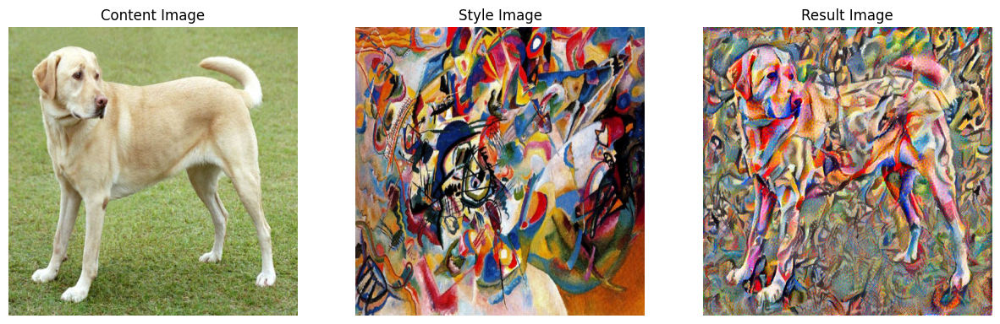

In [20]:
# Initialize the VGGModel
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+09
Style loss: 1.823794e+09
Content loss: 0.000000e+00
Iteration: 100
Total loss: 3.077746e+07
Style loss: 2.770002e+07
Content loss: 3.077445e+06
Iteration: 200
Total loss: 1.031054e+07
Style loss: 7.679328e+06
Content loss: 2.631212e+06
Iteration: 300
Total loss: 5.379474e+06
Style loss: 3.327255e+06
Content loss: 2.052219e+06
Iteration: 400
Total loss: 3.593989e+06
Style loss: 1.946737e+06
Content loss: 1.647252e+06
Iteration: 500
Total loss: 2.765512e+06
Style loss: 1.374704e+06
Content loss: 1.390808e+06
Iteration: 600
Total loss: 2.308212e+06
Style loss: 1.091338e+06
Content loss: 1.216874e+06
Iteration: 700
Total loss: 2.025442e+06
Style loss: 9.280449e+05
Content loss: 1.097396e+06
Iteration: 800
Total loss: 1.833452e+06
Style loss: 8.220037e+05
Content loss: 1.011449e+06
Iteration: 900
Total loss: 1.694892e+06
Style loss: 7.462740e+05
Content loss: 9.486179e+05


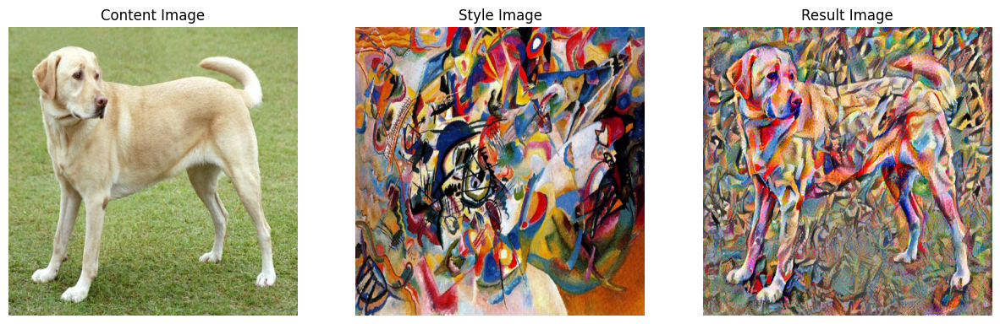

In [4]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+09
Style loss: 1.823794e+09
Content loss: 0.000000e+00
Iteration: 100
Total loss: 3.979375e+07
Style loss: 2.879814e+07
Content loss: 1.099561e+07


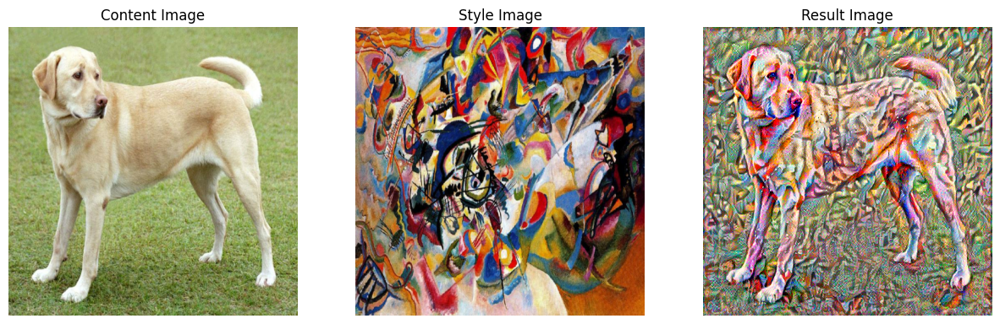

In [6]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+09
Style loss: 1.823794e+09
Content loss: 0.000000e+00
Iteration: 100
Total loss: 4.484507e+07
Style loss: 2.994343e+07
Content loss: 1.490164e+07


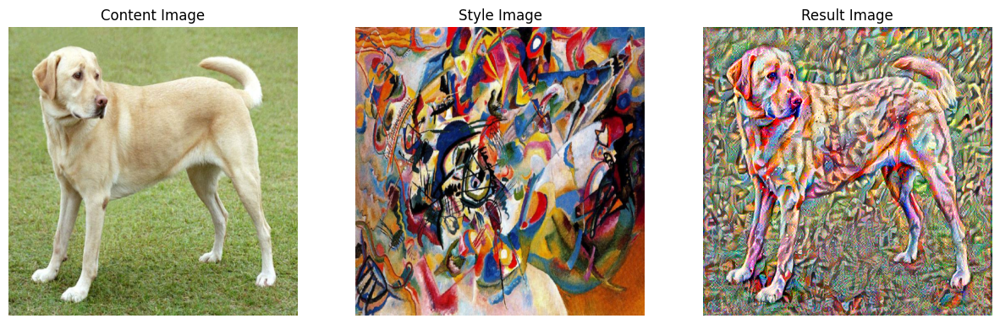

In [7]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+07
Style loss: 1.823794e+07
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.304230e+06
Style loss: 1.150672e+06
Content loss: 1.153558e+06


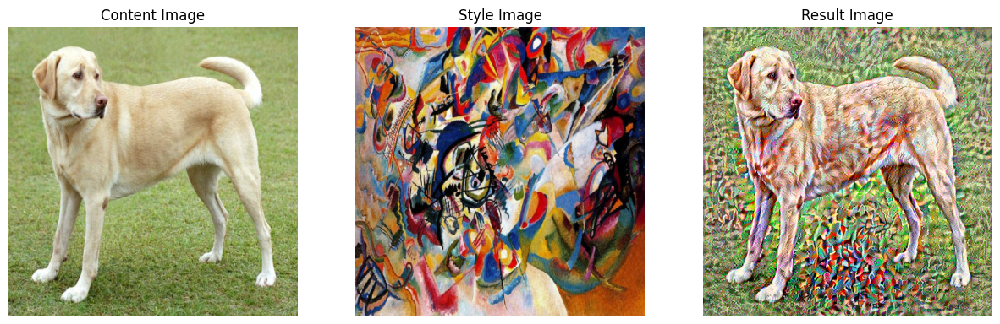

In [8]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+11
Style loss: 1.823794e+11
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.783872e+09
Style loss: 2.746218e+09
Content loss: 3.765426e+07


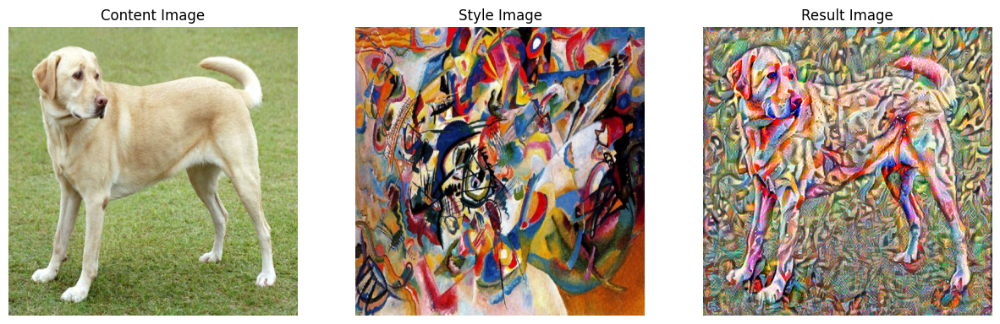

In [9]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.479644e+11
Style loss: 1.479644e+11
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.229432e+09
Style loss: 2.216799e+09
Content loss: 1.263306e+07


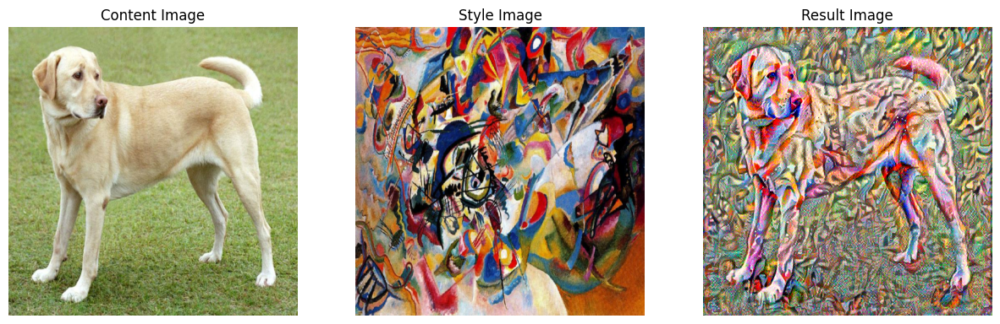

In [10]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+11
Style loss: 1.823794e+11
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.742220e+09
Style loss: 2.741834e+09
Content loss: 3.863377e+05


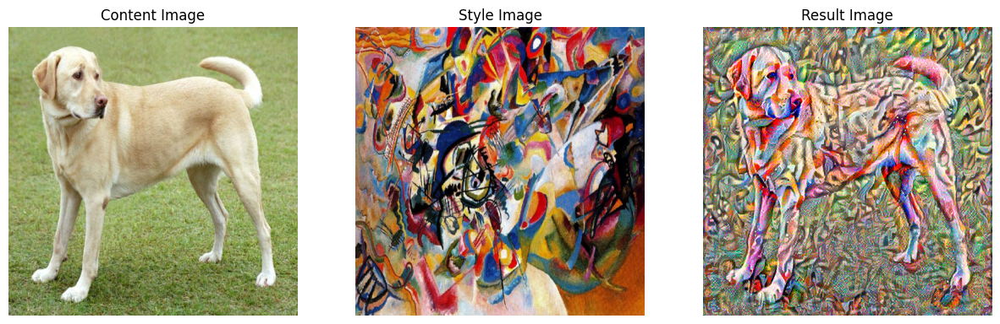

In [11]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()


Output()

Label(value='Upload Content Image')

FileUpload(value={}, accept='image/*', description='Upload')

Label(value='Upload Style Image')

FileUpload(value={}, accept='image/*', description='Upload')

FloatSlider(value=0.01, continuous_update=False, description='Style Weight', max=1.0, min=0.0001, step=0.0001)

FloatSlider(value=1000.0, continuous_update=False, description='Content Weight', max=10000.0, min=100.0, step=…

Button(description='Run Style Transfer', style=ButtonStyle())

Iteration: 0
Total loss: 1.823794e+11
Style loss: 1.823794e+11
Content loss: 0.000000e+00
Iteration: 100
Total loss: 2.745153e+09
Style loss: 2.744767e+09
Content loss: 3.856189e+05
Iteration: 200
Total loss: 7.417579e+08
Style loss: 7.413330e+08
Content loss: 4.248859e+05
Iteration: 300
Total loss: 3.018484e+08
Style loss: 3.014060e+08
Content loss: 4.423883e+05
Iteration: 400
Total loss: 1.633692e+08
Style loss: 1.629193e+08
Content loss: 4.499015e+05
Iteration: 500
Total loss: 1.071652e+08
Style loss: 1.067097e+08
Content loss: 4.554709e+05
Iteration: 600
Total loss: 7.986434e+07
Style loss: 7.940554e+07
Content loss: 4.587968e+05
Iteration: 700
Total loss: 6.452462e+07
Style loss: 6.406469e+07
Content loss: 4.599334e+05
Iteration: 800
Total loss: 5.476935e+07
Style loss: 5.430844e+07
Content loss: 4.609173e+05
Iteration: 900
Total loss: 4.803997e+07
Style loss: 4.757850e+07
Content loss: 4.614767e+05


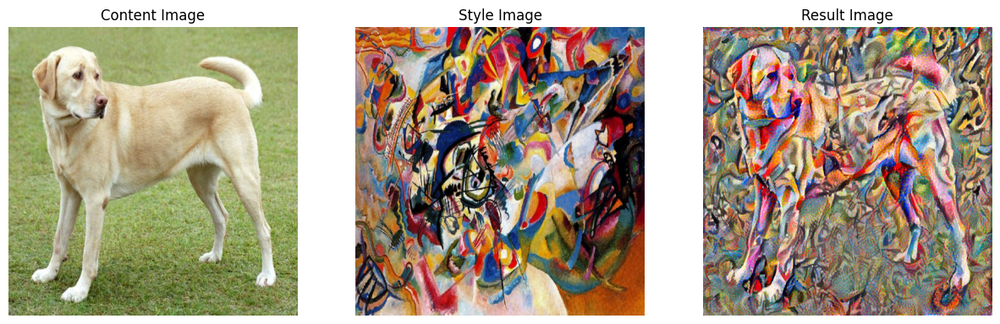

In [13]:
# Initialize the VGGModel (replace VGGModel with your actual model initialization)
vgg_model = VGGModel()
style_transfer = StyleTransfer(vgg_model)
visualizer = Visualization(style_transfer)

# Display the UI for style transfer
visualizer.style_transfer_ui()
